# Informe Final de Carrera

**Repositorio de Github**: https://github.com/pedrofregonese/acamica_proyecto_3

### Propuestas del trabajo

* Utilización de la librería **Plotly** para los gráficos;
* Profundización del **Análisis Exploratorio de Datos**;
* Para el armado del modelo, no se filtrará el dataset por alguna **forma de pago** en particular.

### 1. Preparación del Dataset

In [1]:
#Importación de librerías necesarias para el trabajo
import pandas as pd
import numpy as np
import matplotlib as plt
import matplotlib.pyplot as plt
import datetime
import seaborn as sns
import scipy as sp
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

In [2]:
#Importación de los datasets
data_2019 = pd.read_csv('flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('flujo-vehicular-2017.csv', sep =',')

### 2. Análisis Exploratorio de Datos

In [3]:
data_2019.info()
data_2019.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812153 entries, 0 to 812152
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   periodo         812153 non-null  int64 
 1   fecha           812153 non-null  object
 2   hora_inicio     812153 non-null  int64 
 3   hora_fin        812153 non-null  int64 
 4   dia             812153 non-null  object
 5   estacion        812153 non-null  object
 6   sentido         812153 non-null  object
 7   tipo_vehiculo   812153 non-null  object
 8   forma_pago      812153 non-null  object
 9   cantidad_pasos  812153 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 62.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [4]:
data_2018.info()
data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1375908 entries, 0 to 1375907
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1375908 non-null  int64 
 1   fecha           1375908 non-null  object
 2   hora_inicio     1375908 non-null  int64 
 3   hora_fin        1375908 non-null  int64 
 4   dia             1375908 non-null  object
 5   estacion        1375908 non-null  object
 6   sentido         1375908 non-null  object
 7   tipo_vehiculo   1375908 non-null  object
 8   forma_pago      1375908 non-null  object
 9   cantidad_pasos  1375908 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 105.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,NO COBRADO,29
1,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,TELEPASE,9
2,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,NO COBRADO,73
3,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,TELEPASE,39
4,2018,2018-01-01,2,3,Lunes,Alberdi,Centro,Liviano,NO COBRADO,115


In [5]:
data_2017.info()
data_2017.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372645 entries, 0 to 1372644
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1372645 non-null  int64 
 1   fecha           1372645 non-null  object
 2   hora_inicio     1372645 non-null  int64 
 3   hora_fin        1372645 non-null  int64 
 4   dia             1372645 non-null  object
 5   estacion        1372645 non-null  object
 6   sentido         1372645 non-null  object
 7   tipo_vehiculo   1372645 non-null  object
 8   forma_pago      1372645 non-null  object
 9   cantidad_pasos  1372645 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 104.7+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


Investiguemos que valores toman los campos **estacion, sentido, tipo_vehiculo y forma_pago**

In [6]:
print(data_2019['estacion'].unique())
print(data_2018['estacion'].unique())
print(data_2017['estacion'].unique())

['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


In [7]:
print(data_2019['sentido'].unique())
print(data_2018['sentido'].unique())
print(data_2017['sentido'].unique())

['Centro' 'Provincia']
['Centro' 'Provincia']
['Centro' 'Provincia']


In [8]:
print(data_2019['tipo_vehiculo'].unique())
print(data_2018['tipo_vehiculo'].unique())
print(data_2017['tipo_vehiculo'].unique())

['Liviano' 'Pesado']
['Liviano' 'Pesado']
['Liviano' 'Pesado']


In [9]:
print(data_2019['forma_pago'].unique())
print(data_2018['forma_pago'].unique())
print(data_2017['forma_pago'].unique())

['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'INFRACCION'
 'T. DISCAPACIDAD']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'TARJETA DISCAPACIDAD' 'EXENTO'
 'INFRACCION' 'MONEDERO' 'Otros']


##### Podemos decir entonces que los años 2017, 2018 y 2019 tienen las siguientes columnas con la siguiente información:

**periodo**: año del dset 

**fecha**: año dia mes

**hora_inicio** hora de inicio de la cuenta de vehiculos (DROP)

**hora_fin** hora de fin de la cuenta de vehiculos (Vamos a usar esta para tomar la hora)

**dia**: dia de la semana 

**estacion**: estaciones de peaje, difieren levemente entre los años (Dellepiane se unifica en 2019, antes habia Dellepiane Liniers y Centro, y se agrega PDB)

**sentido**: Centro o Provincia

**tipo_vehiculo**: Liviano o Pesado

**forma_pago**: Hay varias y varian entre los años.

**cantidad_pasos**: Cantidad de vehiculos

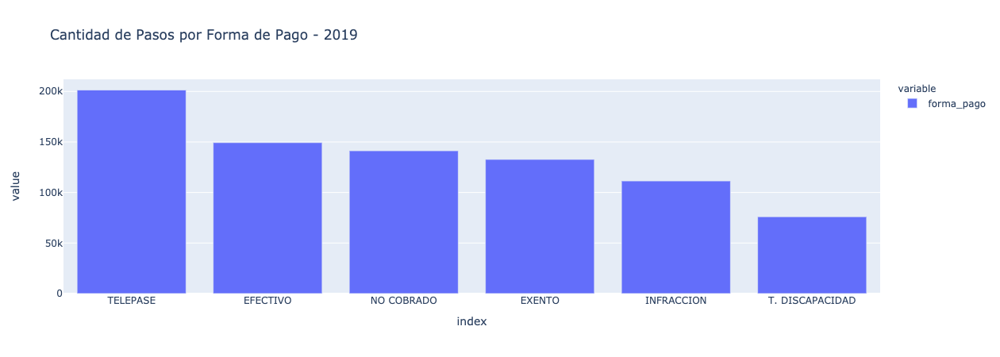

In [10]:
#Gráfico de barras con la frecuencia de los tipos de pasos en 2019
forma_de_pago_2019 = data_2019['forma_pago'].value_counts()
forma_de_pago_2019
fig = px.bar(forma_de_pago_2019,title='Cantidad de Pasos por Forma de Pago - 2019')
fig.show()

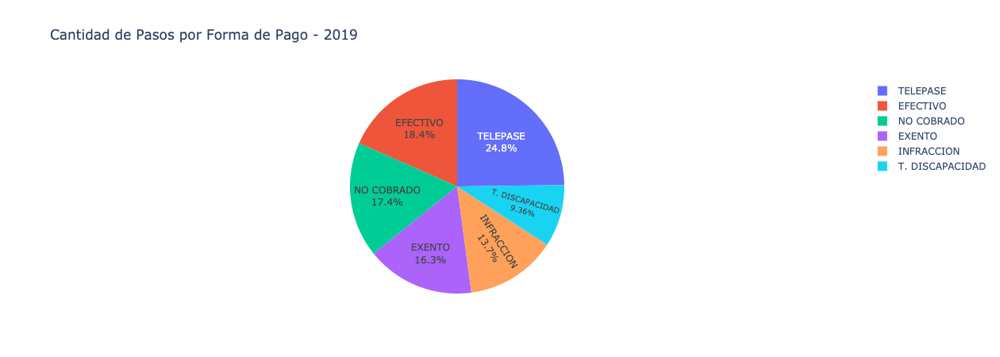

In [11]:
#Grafico de torta con la frecuencia proporcional de los tipos de pasos en 2019
forma_de_pago_2019_prop = data_2019['forma_pago'].value_counts()/data_2019.shape[0]*100
forma_de_pago_2019_prop
fig = px.pie(forma_de_pago_2019_prop, values='forma_pago', names=forma_de_pago_2019_prop.index, 
             title='Cantidad de Pasos por Forma de Pago - 2019',)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

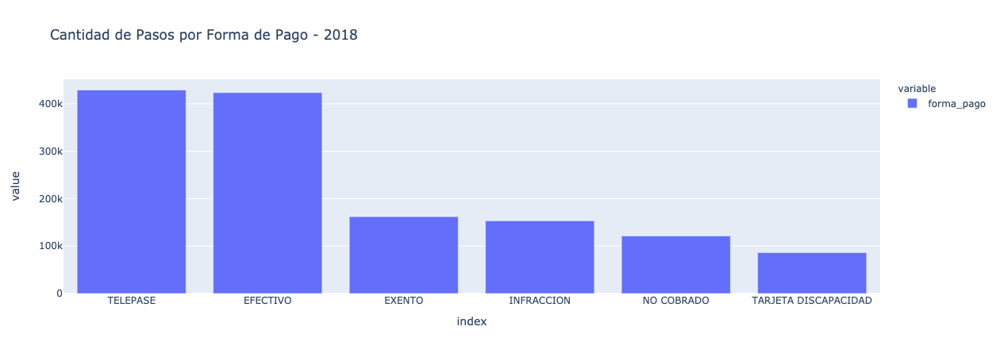

In [12]:
#Gráfico de barras con la frecuencia de los tipos de pasos en 2018
forma_de_pago_2018 = data_2018['forma_pago'].value_counts()
forma_de_pago_2018
fig = px.bar(forma_de_pago_2018,title='Cantidad de Pasos por Forma de Pago - 2018')
fig.show()

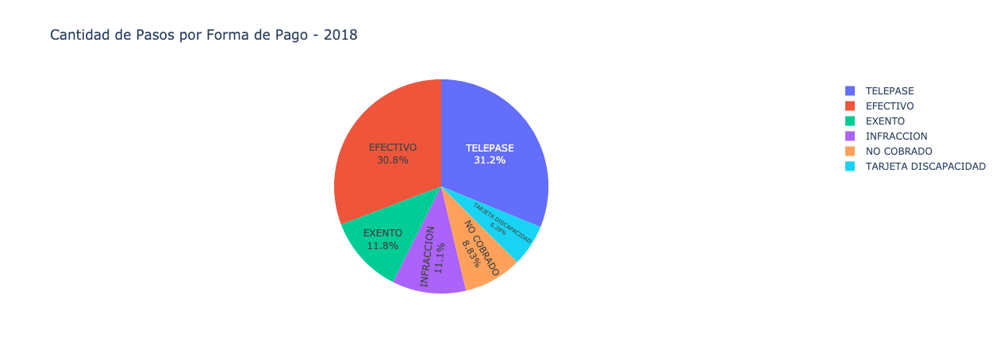

In [13]:
#Grafico de torta con la frecuencia proporcional de los tipos de pasos en 2018
forma_de_pago_2018_prop = data_2018['forma_pago'].value_counts()/data_2018.shape[0]*100
forma_de_pago_2018_prop
fig = px.pie(forma_de_pago_2018_prop, values='forma_pago', names=forma_de_pago_2018_prop.index, 
             title='Cantidad de Pasos por Forma de Pago - 2018',)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

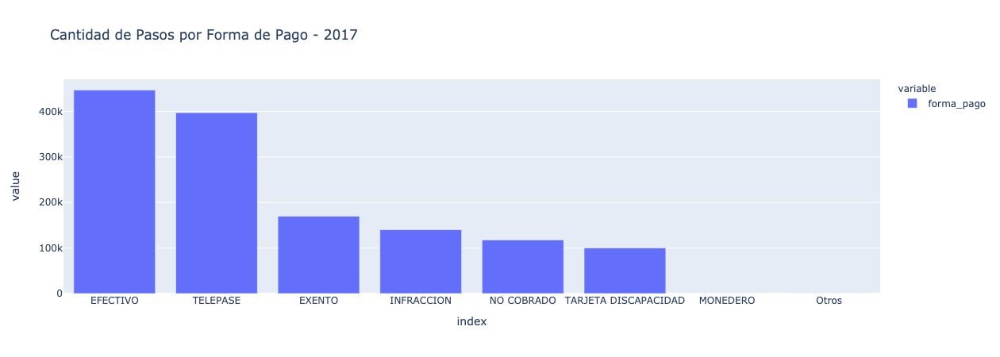

In [14]:
#Gráfico de barras con la frecuencia de los tipos de pasos en 2017
forma_de_pago_2017 = data_2017['forma_pago'].value_counts()
forma_de_pago_2017
fig = px.bar(forma_de_pago_2017,title='Cantidad de Pasos por Forma de Pago - 2017')
fig.show()

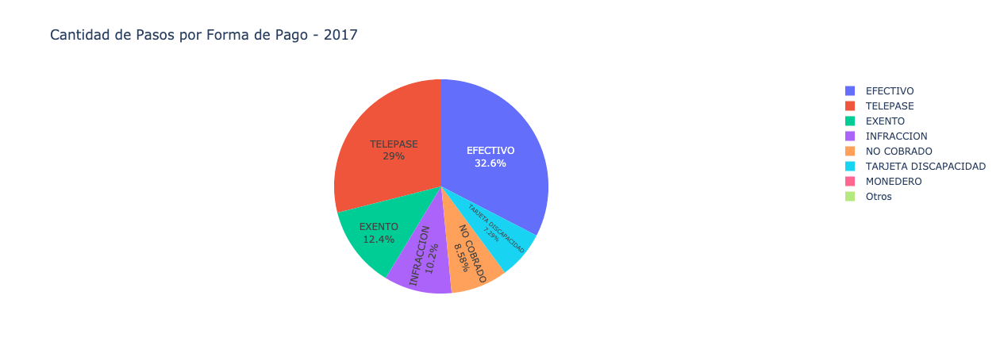

In [15]:
#Grafico de torta con la frecuencia proporcional de los tipos de pasos en 2017
forma_de_pago_2017_prop = data_2017['forma_pago'].value_counts()/data_2017.shape[0]*100
forma_de_pago_2017_prop
fig = px.pie(forma_de_pago_2017_prop, values='forma_pago', names=forma_de_pago_2017_prop.index, 
             title='Cantidad de Pasos por Forma de Pago - 2017',)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

**Análisis**: para el proyecto 3, se utilizó únicamente la forma de pago en Efectivo. Los anteriores gráficos permiten comprobar que, más allá de que dicha forma de pago es proporcinalmente relevante, también puede apreciarse que con los años fue disminuyendo su participación (desde 32,6% en 2017 a 18,4% en 2019).

Como el objetivo del modelo es predecir la afluencia del tráfico total, y no específico por alguna forma de pago, en este proyecto *no se filtrará por este componente*.

Vamos a estar trabajando con la estación **Illia**


In [16]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])

#Nos quedamos solamente con la estación Illia
mask = dataset.estacion=='Illia'
dataset = dataset[mask]

#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

dataset.head()

,fecha,hora_fin,dia,sentido,tipo_vehiculo,cantidad_pasos
19,2019-01-01,1,Martes,Centro,Liviano,146
20,2019-01-01,1,Martes,Centro,Liviano,59
21,2019-01-01,1,Martes,Centro,Pesado,1
22,2019-01-01,1,Martes,Provincia,Liviano,147
23,2019-01-01,1,Martes,Provincia,Liviano,106


In [17]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['fecha','hora_fin'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha2
19,Martes,Centro,Liviano,146,2019-01-01 01:00:00
20,Martes,Centro,Liviano,59,2019-01-01 01:00:00
21,Martes,Centro,Pesado,1,2019-01-01 01:00:00
22,Martes,Provincia,Liviano,147,2019-01-01 01:00:00
23,Martes,Provincia,Liviano,106,2019-01-01 01:00:00


In [18]:
#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
19,Martes,Centro,Liviano,146,2019-01-01 01:00:00
20,Martes,Centro,Liviano,59,2019-01-01 01:00:00
21,Martes,Centro,Pesado,1,2019-01-01 01:00:00
22,Martes,Provincia,Liviano,147,2019-01-01 01:00:00
23,Martes,Provincia,Liviano,106,2019-01-01 01:00:00


In [19]:
#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)
dataset

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Centro,Liviano,459,2017-01-01 00:00:00
1,Domingo,Provincia,Pesado,3,2017-01-01 00:00:00
2,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
3,Domingo,Provincia,Pesado,7,2017-01-01 00:00:00
4,Domingo,Provincia,Pesado,6,2017-01-01 00:00:00
...,...,...,...,...,...
752547,Martes,Centro,Liviano,122,2019-12-31 23:00:00
752548,Martes,Centro,Liviano,3,2019-12-31 23:00:00
752549,Martes,Centro,Liviano,4,2019-12-31 23:00:00
752550,Martes,Centro,Liviano,1,2019-12-31 23:00:00


In [20]:
#Resampleamos nuestros datos para agrupar por dia
diario = dataset.resample('D', on = 'fecha').sum()
print(diario.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,45478
2017-01-02,89289
2017-01-03,92602
2017-01-04,95813
2017-01-05,100044


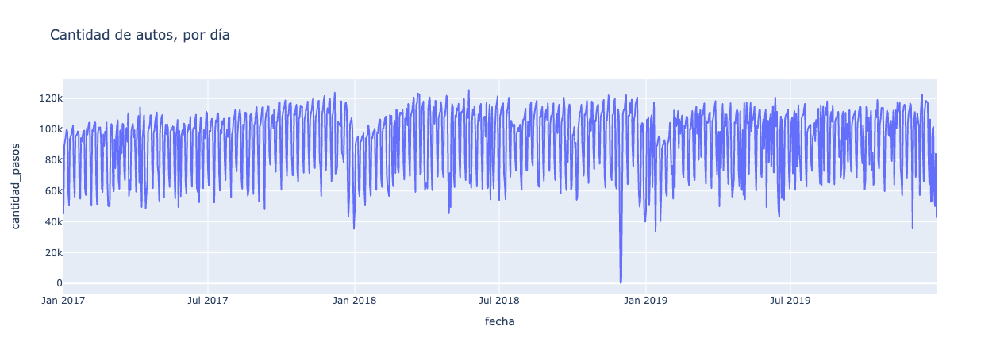

In [21]:
#Gráfico de los datos, con frecuencia diaria
fig = px.line(diario, x=diario.index, y="cantidad_pasos", title='Cantidad de autos, por día')
fig.show()

#### Outliers

El gráfico anterior evidencia la existencia de outliers, por lo cual se procede a removerlos.

In [22]:
#Detección y reemplazo de valores atípicos
diario.cantidad_pasos[diario.cantidad_pasos < 10000] = np.nan

diario['cantidad_pasos']=diario.cantidad_pasos.fillna(diario.cantidad_pasos.rolling(4, min_periods=1).mean())

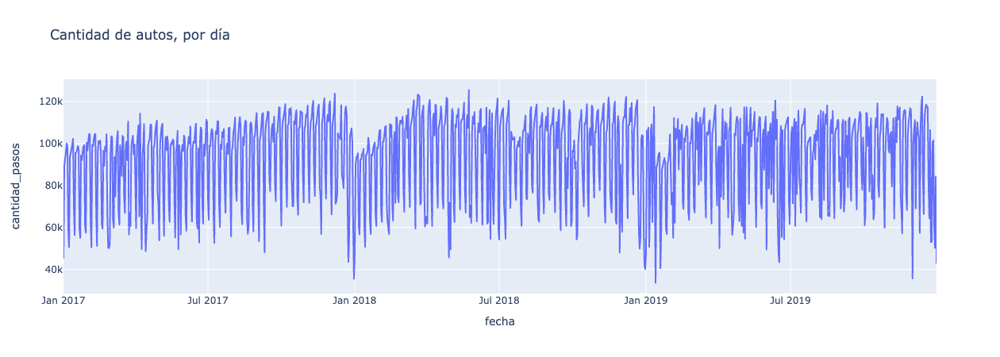

In [23]:
#Gráfico de cantidad de autos por día 
fig = px.line(diario, x=diario.index, y="cantidad_pasos", title='Cantidad de autos, por día')
fig.show()

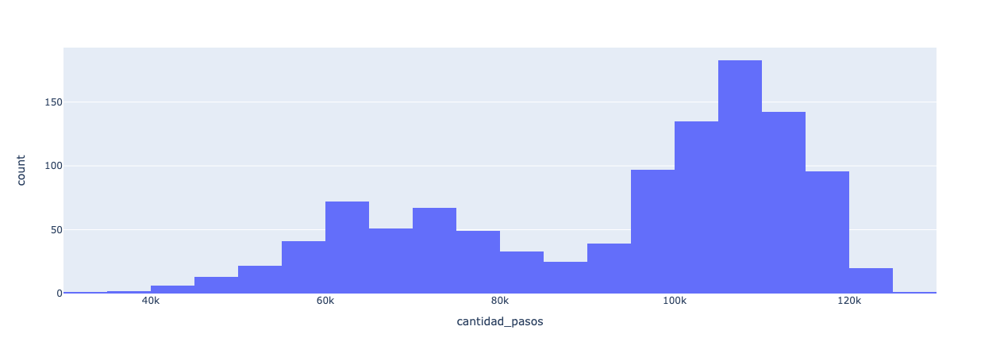

In [24]:
#Histograma para analizar la distribución de la cantidad de pasos por día
fig = px.histogram(diario, x="cantidad_pasos")
fig.show()

**Analisis**: puede apreciarse una distribución bimodal de la cantidad de pasos por día

In [25]:
#Copia del dataset original
dt_original = diario.copy()
dt_original.head()

,cantidad_pasos
fecha,
2017-01-01,45478.0
2017-01-02,89289.0
2017-01-03,92602.0
2017-01-04,95813.0
2017-01-05,100044.0


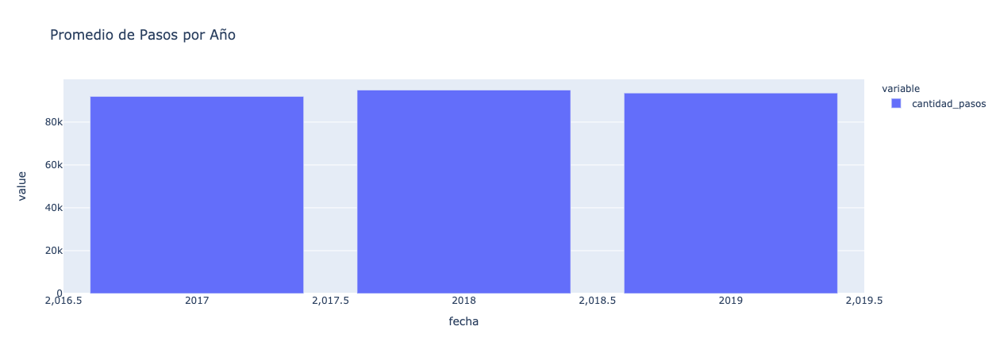

In [26]:
#Promedio de pasos diarios por año
dt_original.reset_index(inplace=True)
pasos_anuales = dt_original.groupby(dt_original.fecha.dt.year)['cantidad_pasos'].mean()
fig = px.bar(pasos_anuales,title='Promedio de Pasos por Año')
fig.show()

**Analisis**: puede apreciarse que la media de pasos diarios se mantiene relativamente estable

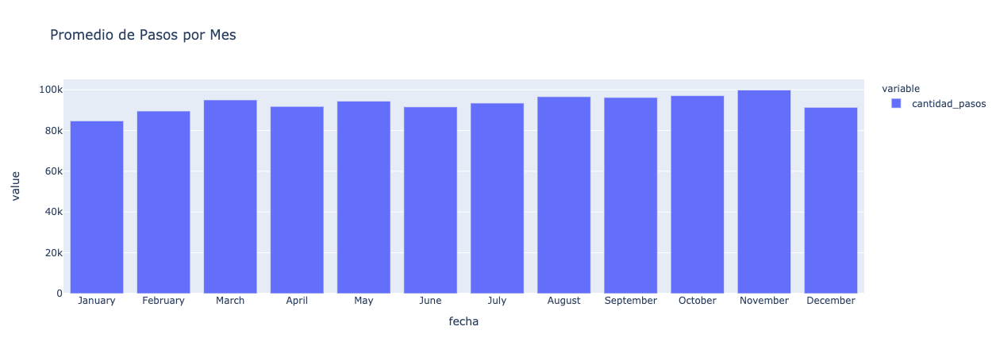

In [27]:
#Promedio de pasos diarios por mes
dt_original.reset_index(inplace=True)
pasos_mensuales = dt_original.groupby(dt_original.fecha.dt.month_name(), sort=False)['cantidad_pasos'].mean()
fig = px.bar(pasos_mensuales,title='Promedio de Pasos por Mes')
fig.show()

**Analisis**: al estudiar los promedios diarios por mes, no pareciera haber grandes variaciones entre los distintos meses del año.

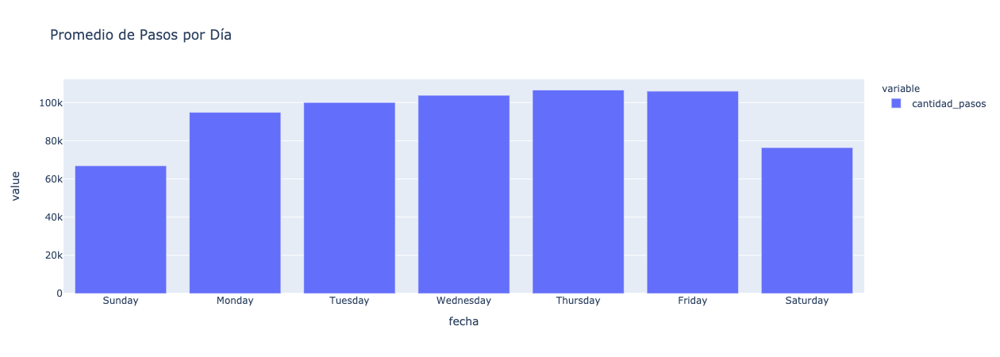

In [28]:
#Promedio de pasos diarios por día de la semana
dt_original.reset_index(inplace=True)
pasos_diarios = dt_original.groupby(dt_original.fecha.dt.day_name(), sort=False)['cantidad_pasos'].mean()
fig = px.bar(pasos_diarios,title='Promedio de Pasos por Día')
fig.show()

**Analisis**: en primer lugar, puede observarse que los días de la semana con menor promedio de pasos diarios son aquellos correspondientes al fin de semana (sábado y domingo). Luego, una posible explicación para los altos promedios los días jueves y viernes puede ser la afluencia de tránsito con dirección a la Provincia de Buenos Aires por el fin de semana.

#### Resampleos

In [29]:
#Resampleo semanal
semanal = dataset.resample('W', on = 'fecha').mean().reset_index()
semanal.head()

,fecha,cantidad_pasos
0,2017-01-01,76.433613
1,2017-01-08,101.349714
2,2017-01-15,106.540799
3,2017-01-22,104.136751
4,2017-01-29,102.495374


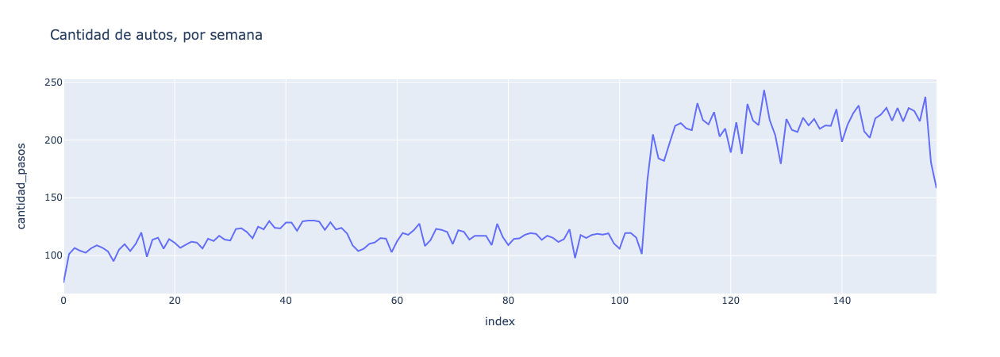

In [30]:
#Gráfico del resampleo semanal
fig = px.line(semanal, x=semanal.index, y="cantidad_pasos", title='Cantidad de autos, por semana')
fig.show()

In [31]:
#Resampleo mensual
mensual = dataset.resample('M', on = 'fecha').mean().reset_index()
mensual.head()

,fecha,cantidad_pasos
0,2017-01-31,103.569495
1,2017-02-28,103.514621
2,2017-03-31,107.654214
3,2017-04-30,110.849783
4,2017-05-31,110.167559


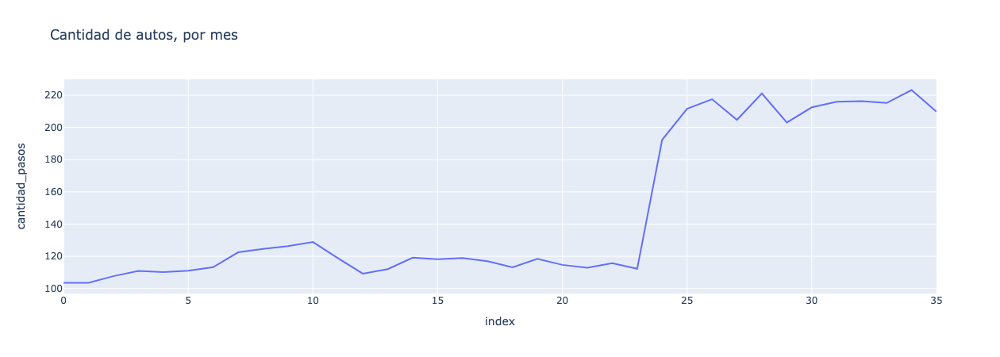

In [32]:
#Gráfico del resampleo mensual
fig = px.line(mensual, x=mensual.index, y="cantidad_pasos", title='Cantidad de autos, por mes')
fig.show()

In [33]:
#Para comprobar si es estacionario o no, se utiliza el Augmented Dickey-Fuller test
X = diario.cantidad_pasos
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.577339
p-value: 0.000142
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568


**Análisis**: al ser el p-valor menor a 0.05, se rechaza la hipótesis nula. Por ende, puede afirmarse que los datos son estacionarios.

### Componentes de la serie

#### Media móvil

Se realizan 3 ventanas distintas: una semana, dos semanas y un mes (30 días)

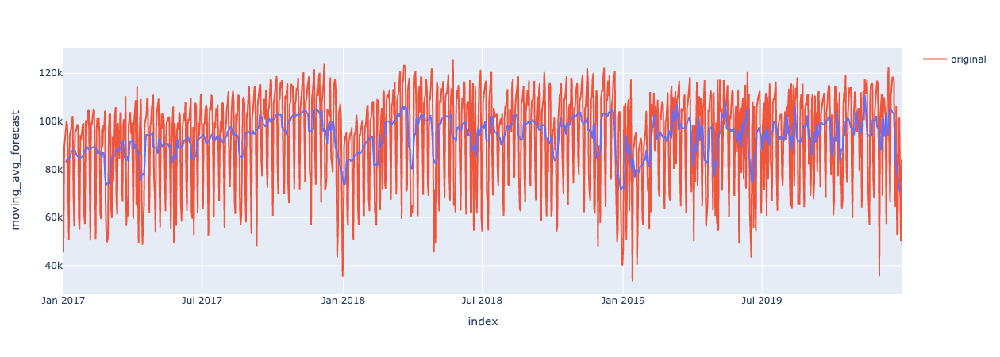

In [34]:
#Una semana
ventana = diario.copy()
ventana['moving_avg_forecast'] = diario['cantidad_pasos'].rolling(7, center=True).mean()
ventana = pd.DataFrame(ventana).set_index(diario.index.values)

fig = px.line(ventana, x=ventana.index, y="moving_avg_forecast", hover_name = 'moving_avg_forecast')
fig.add_scatter(x=diario.index, y=diario['cantidad_pasos'], mode='lines', name = 'original')
fig.show()

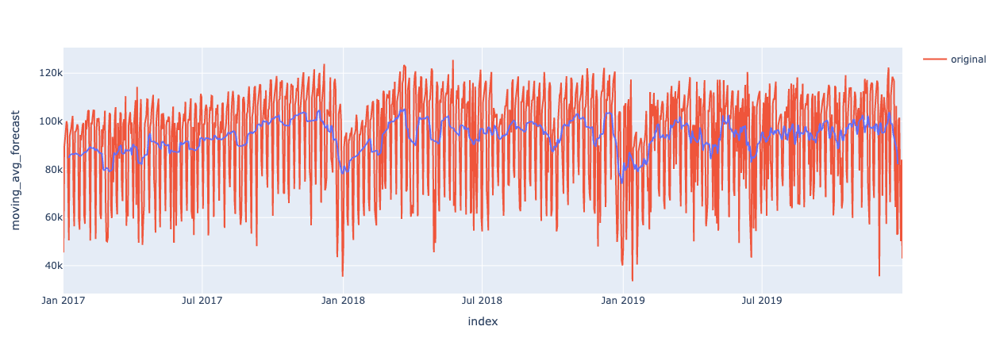

In [35]:
#Dos semanas
ventana = diario.copy()
ventana['moving_avg_forecast'] = diario['cantidad_pasos'].rolling(14, center=True).mean()
ventana = pd.DataFrame(ventana).set_index(diario.index.values)

fig = px.line(ventana, x=ventana.index, y="moving_avg_forecast", hover_name = 'moving_avg_forecast')
fig.add_scatter(x=diario.index, y=diario['cantidad_pasos'], mode='lines', name = 'original')
fig.show()

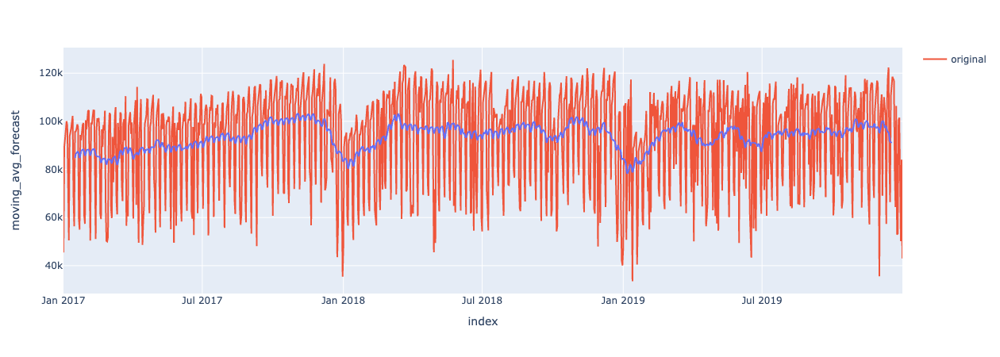

In [36]:
#Un mes
ventana = diario.copy()
ventana['moving_avg_forecast'] = diario['cantidad_pasos'].rolling(30, center=True).mean()
ventana = pd.DataFrame(ventana).set_index(diario.index.values)

fig = px.line(ventana, x=ventana.index, y="moving_avg_forecast", hover_name = 'moving_avg_forecast')
fig.add_scatter(x=diario.index, y=diario['cantidad_pasos'], mode='lines', name = 'original')
fig.show()

**Análisis**: puede apreciarse que, a medida que se extiende la ventana, la media móvil se suaviza.

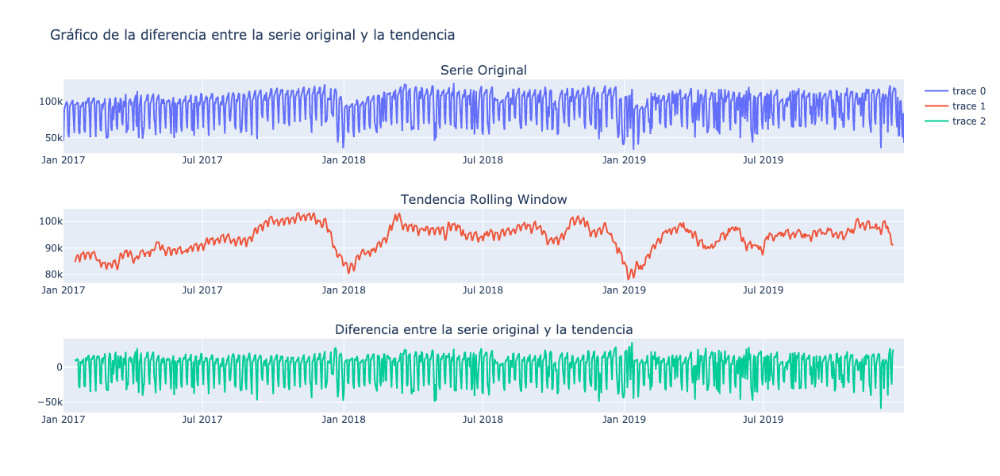

In [37]:
#Gráfico de la diferencia entre la serie original y la tendencia
fig = make_subplots(rows=3, cols=1,subplot_titles=("Serie Original","Tendencia Rolling Window", "Diferencia entre la serie original y la tendencia"))

fig.append_trace(go.Scatter(
    x=diario.index,
    y=diario.cantidad_pasos,
), row=1, col=1)

fig.append_trace(go.Scatter(
    x=ventana.index,
    y=ventana.moving_avg_forecast,
), row=2, col=1)

fig.append_trace(go.Scatter(
    x=diario.index,
    y=diario.cantidad_pasos - ventana.moving_avg_forecast,    
), row=3, col=1)


fig.update_layout(height=600, width=900, title_text="Gráfico de la diferencia entre la serie original y la tendencia")
fig.show()

#### Tendencia lineal

In [38]:
#Creación de un nuevo campo para obtener la fecha en números enteros
diario['fecha_numeros']=diario.index.map(datetime.datetime.toordinal)
diario.head()

,cantidad_pasos,fecha_numeros
fecha,,
2017-01-01,45478.0,736330
2017-01-02,89289.0,736331
2017-01-03,92602.0,736332
2017-01-04,95813.0,736333
2017-01-05,100044.0,736334


In [39]:
#Definición de la regresión lineal
lr = LinearRegression()
lr.fit(diario.fecha_numeros.values.reshape(-1, 1), diario.cantidad_pasos)

LinearRegression()

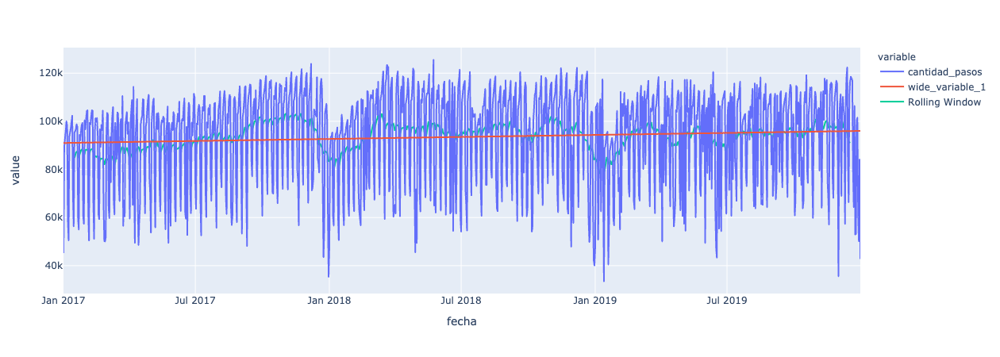

In [40]:
#Gráfico de la tendencia lineal

fig = px.line(diario, x=diario.index, y=[diario.cantidad_pasos,lr.predict(diario.fecha_numeros.values.reshape(-1, 1))]) #'Cantidad de pasos''Cantidad de pasos - Ajuste Lineal'
fig.add_scatter(x=ventana.index, y=ventana.moving_avg_forecast, mode='lines', name = 'Rolling Window') #'Cantidad de pasos - Rolling Window'
fig.show()

**Análisis**: el ajuste lineal pareciera capturar la tendencia general de la serie, pero sigue siendo una manera imperfecta de representar una serie con tanta variación.

#### Descomposición

In [41]:
#Descomposición de la serie
result = seasonal_decompose(diario.cantidad_pasos, model='multiplicative')

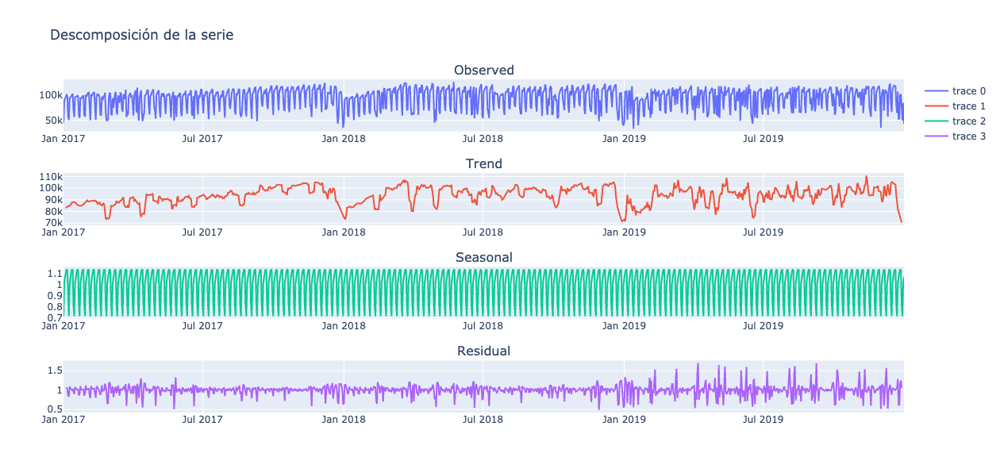

In [42]:
#Gráfico de la descomposición de la serie
trace1 = go.Scatter(
    x=result.observed.index,
    y=result.observed
)

trace2 = go.Scatter(
    x=result.trend.index,
    y=result.trend,
    xaxis='x2',
    yaxis='y2'
)

trace3 = go.Scatter(
    x=result.seasonal.index,
    y=result.seasonal,
    xaxis='x3',
    yaxis='y3'
)

trace4 = go.Scatter(
    x=result.resid.index,
    y=result.resid,
    xaxis='x4',
    yaxis='y4'
)

data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    showlegend=False
)

fig = make_subplots(
    rows=4,
    cols=1,
    print_grid=False,
    subplot_titles=("Observed","Trend", "Seasonal","Residual")
)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 3, 1)
fig.append_trace(trace4, 4, 1)
fig.update_layout(height=600, width=900, title_text="Descomposición de la serie")
fig.show()

**Análisis**: de manera similar a los gráficos anteriores, la descomposición de la serie permite observar una tendencia negativa.

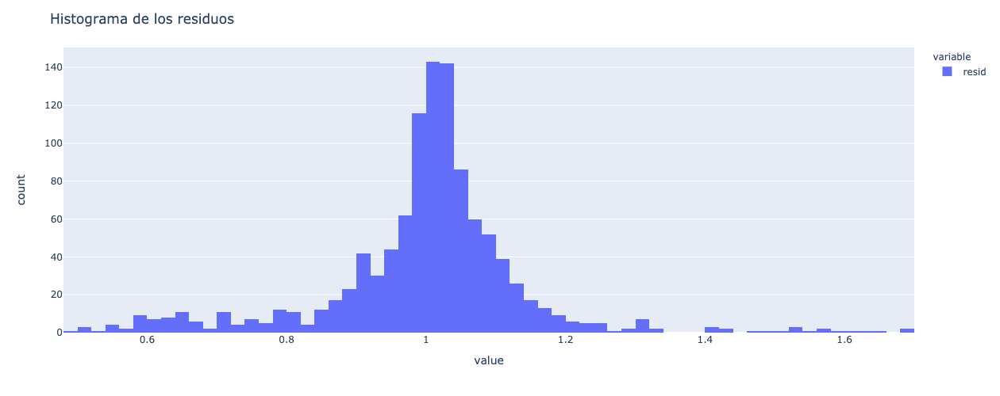

In [43]:
#Histograma de los residuos
fig = px.histogram(result.resid)
fig.update_layout(height=500, width=500, title_text="Histograma de los residuos")
fig.show()

**Análisis**: puede apreciarse que los residuos presentan una distribución normal.

### Predicción a futuro

#### Selección de la métrica de evaluación
Para todos los modelos de este proyecto, se utilizarán como métricas de evaluación tanto la **raíz del error cuadrático medio** (RMSE) y el **coeficiente de determinación** (r2). 

En el caso del RMSE, se buscarán obtener valores más bajos. Para el coeficiente de determinación, en cambio, se buscará acercar el coeficiente a 1.

In [44]:
#Elimino la columna con la fecha expresada en números enteros
diario.drop(columns = ['fecha_numeros'], inplace = True)
diario.head()

,cantidad_pasos
fecha,
2017-01-01,45478.0
2017-01-02,89289.0
2017-01-03,92602.0
2017-01-04,95813.0
2017-01-05,100044.0


In [45]:
#Impresión del shape del nuevo dataset
diario.shape

(1095, 1)

In [46]:
#Definición del lookback para el modelo
look_back = 90*1

In [47]:
#Definición de x e y
N=diario.shape[0]
X= np.zeros((N-look_back-1, look_back))
y= np.zeros(N-look_back-1)

print(X.shape, y.shape)

(1004, 90) (1004,)


In [48]:
#Definición de la función
for i in range(X.shape[0]):
    X[i,:] = diario.values[i:i+look_back].ravel()
    y[i] = diario.values[i+look_back]

In [49]:
#Separación entre datos de entrenamiento y evaluación
N_train = 2*365 - look_back # cantidad de instancias que vamos a usar para entrenar. 
N_test = 365 #cantidad de puntos que vamos a usar para evaluar
N_total = N_train + N_test

length_total = N_train + N_test + look_back

X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test]
print(X_test.shape, y_test.shape)

(640, 90) (640,)
(364, 90) (364,)


**Benchmark**

El modelo benchmark se realizará utilizando la predicción resultante de la copia del valor de la fecha anterior

In [50]:
y_test_pred_benchmark = y[-1 + N_train:N_train+N_test - 1]

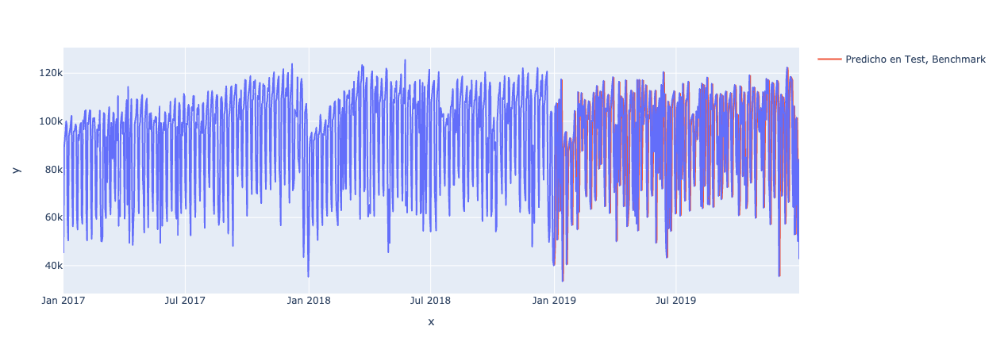

In [51]:
#Gráfico del modelo benchmark
fig = px.line(diario, x=diario.index[:length_total], y=diario.cantidad_pasos[:length_total])
fig.add_scatter(x=diario.index[N_train+look_back: length_total], y=y_test_pred_benchmark, mode='lines', name = 'Predicho en Test, Benchmark')
fig.show()

In [52]:
#Raíz del error cuadrático medio
y_test_pred_benchmark = y[-1 + N_train-1:N_train-1+N_test - 1]
MSE = mean_squared_error(y_test, y[-1 + N_train:N_train-1+N_test - 1])
print('Raíz del error cuadrático medio:',np.sqrt(MSE))

Raíz del error cuadrático medio: 25845.124340817318


### Random Forest

In [53]:
#Definición del modelo de regresión con random forest
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs = 4).fit(X_train,y_train)

In [54]:
y_pred = rf.predict(X)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

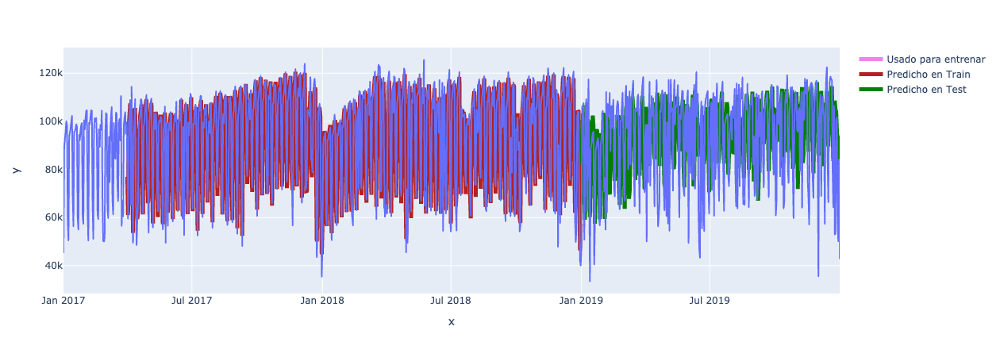

In [55]:
#Gráfico el Random Forest con hiperparámetros iniciales
fig = px.line(diario, x=diario.index[:length_total], y=diario.cantidad_pasos[:length_total],width=10)
fig.add_scatter(x=diario.index[:N_train + look_back - 1], y=diario[:N_train + look_back - 1], mode='lines', name = 'Usado para entrenar',line=dict(color='violet', width=5))
fig.add_scatter(x=diario.index[look_back: look_back + N_train], y=y_train_pred, mode='lines', name = 'Predicho en Train',line=dict(color='firebrick', width=5))
fig.add_scatter(x=diario.index[N_train+look_back: length_total-1], y=y_test_pred, mode='lines', name = 'Predicho en Test',line=dict(color='green', width=5))
fig.show()

In [56]:
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

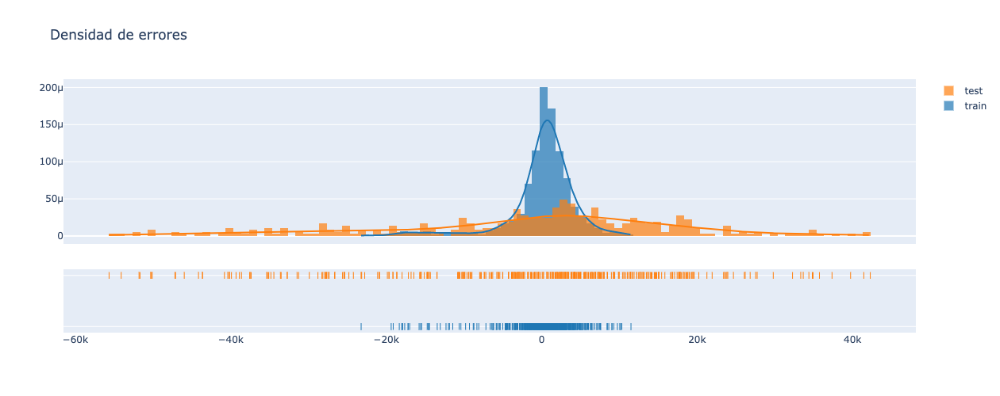

In [57]:
#Gráfico de la densidad de errores para el Random Forest con hiperparámetros iniciales
x1 = y_train - y_train_pred
x2 = y_test - y_test_pred
hist_data = [x1, x2]
group_labels = ['train', 'test']
fig = ff.create_distplot(hist_data, group_labels, bin_size=1000)
fig.update_layout(height=500, width=500, title_text="Densidad de errores")
fig.show()

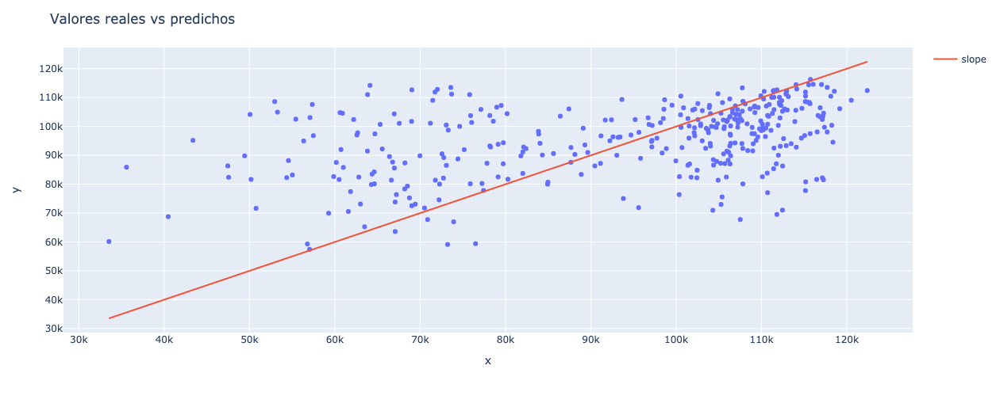

In [58]:
#Gráfico de valores reales vs valores predichos para el Random Forest con hiperparámetros iniciales
fig = px.scatter(x=y_test, y=y_test_pred)
fig.add_trace(
    go.Scatter(x=y_test, y=y_test, name="slope", line_shape='linear')
)
fig.update_layout(height=500, width=500, title_text="Valores reales vs predichos")
fig.show()

In [59]:
#Evaluación del modelo Random Forest con hiperparámetros iniciales
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test}')
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
print(f'r2 en Train: {r2_train}')
print(f'r2 en Test: {r2_test}')

Raíz del error cuadrático medio en Train: 4321.6958204431185
Raíz del error cuadrático medio en Test: 18797.162213454714
r2 en Train: 0.9567654805910554
r2 en Test: 0.13593026204250158


**Análisis**: la distribución de errores graficada con los histogramas es de carácter simétrica, similar a una distribución de tipo gaussiana. Además, las distribuciones son consistentes entre los conjuntos de train y test. Por ende, puede afirmarse que la aproximación de los datos es adecuada. En cuanto al gráfico de los valores de y vs y_pred en los datos de test, puede apreciarse que los puntos se ubican cerca de la recta, lo cual es indicador de que el modelo es un buen regresor. 

Respecto al modelo benchmark, el Random Forest, con sus hiperparámetros iniciales, tiene mejores resultados.

**Optimización de hiperparámetros - Random Forest**

In [60]:
tscv = TimeSeriesSplit(n_splits = 5)

# Grilla para Random Search
param_dist = {'max_depth':sp.stats.randint(1, 10),
              'n_estimators':sp.stats.randint(1, 25),
              'criterion': ['mse', 'mae'], 
              'min_samples_split':[2,3,4],
              'min_samples_leaf':[2,3,4]}


# Definición del random search
model = RandomizedSearchCV(rf, param_dist,n_iter=25, random_state=0, cv=tscv,n_jobs=-1,verbose=5)

In [61]:
#Entrenamiento del random forest con la grilla definida arriba y CV con tamaño de Fold=5
model.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                   estimator=RandomForestRegressor(n_jobs=4, random_state=42),
                   n_iter=25, n_jobs=-1,
                   param_distributions={'criterion': ['mse', 'mae'],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f9e31b0b1c0>,
                                        'min_samples_leaf': [2, 3, 4],
                                        'min_samples_split': [2, 3, 4],
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f9e30c89fd0>},
                   random_state=0, verbose=5)

In [62]:
# Impresión de los mejores parámetros para el modelo de random forest
print("Mejores parametros: "+str(model.best_params_))
print("Mejor Score: "+str(model.best_score_)+'\n')

scores = pd.DataFrame(model.cv_results_)
scores

Mejores parametros: {'criterion': 'mse', 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 3, 'n_estimators': 22}
Mejor Score: 0.6522646719076342



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.122959,0.072452,0.018422,0.016092,mse,6,2,3,20,"{'criterion': 'mse', 'max_depth': 6, 'min_samp...",0.497457,0.610302,0.614407,0.683002,0.668283,0.614690,0.065271,9
1,0.565044,0.401417,0.014349,0.010637,mae,3,2,4,13,"{'criterion': 'mae', 'max_depth': 3, 'min_samp...",0.410285,0.522177,0.565309,0.703644,0.545018,0.549286,0.093976,17
2,0.120968,0.044117,0.006791,0.002173,mse,2,4,4,18,"{'criterion': 'mse', 'max_depth': 2, 'min_samp...",0.663591,0.611165,0.590149,0.719681,0.600652,0.637047,0.048429,4
3,1.102019,0.780551,0.005958,0.000393,mae,9,3,2,20,"{'criterion': 'mae', 'max_depth': 9, 'min_samp...",0.581698,0.433025,0.603079,0.697670,0.586550,0.580404,0.084883,11
4,0.087338,0.039476,0.007760,0.003955,mse,4,3,4,16,"{'criterion': 'mse', 'max_depth': 4, 'min_samp...",0.630728,0.605957,0.640566,0.699846,0.641207,0.643661,0.030858,3
5,0.328849,0.265401,0.007827,0.003107,mae,1,4,2,18,"{'criterion': 'mae', 'max_depth': 1, 'min_samp...",0.533868,0.430914,0.484476,0.678055,0.510816,0.527626,0.082663,20
6,0.151322,0.138566,0.003959,0.002003,mae,4,4,2,2,"{'criterion': 'mae', 'max_depth': 4, 'min_samp...",0.585425,0.549492,0.542132,0.584505,0.583493,0.569009,0.019093,16
7,0.381213,0.224121,0.005954,0.000458,mae,1,4,2,24,"{'criterion': 'mae', 'max_depth': 1, 'min_samp...",0.507142,0.402187,0.493306,0.678330,0.518494,0.519892,0.089251,22
8,0.066788,0.039146,0.001169,0.000275,mae,3,2,4,1,"{'criterion': 'mae', 'max_depth': 3, 'min_samp...",-1.763856,0.572197,0.177236,0.436036,0.450008,-0.025676,0.878561,25
9,0.033081,0.006755,0.005350,0.001576,mse,5,3,3,7,"{'criterion': 'mse', 'max_depth': 5, 'min_samp...",0.566985,0.637120,0.629902,0.658083,0.614103,0.621238,0.030591,7


In [63]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

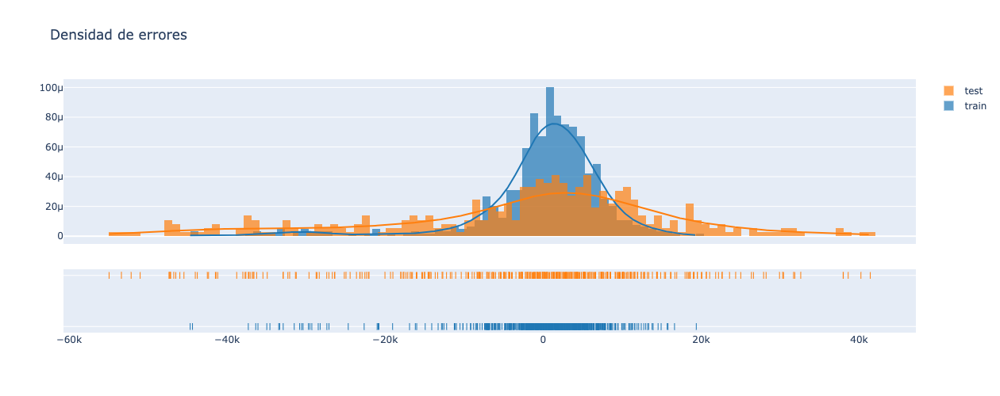

In [64]:
##Gráfico de la densidad de errores para el Random Forest con hiperparámetros optimizados
x1 = y_train - y_train_pred
x2 = y_test - y_test_pred
hist_data = [x1, x2]
group_labels = ['train', 'test']
fig = ff.create_distplot(hist_data, group_labels, bin_size=1000)
fig.update_layout(height=500, width=500, title_text="Densidad de errores")
fig.show()

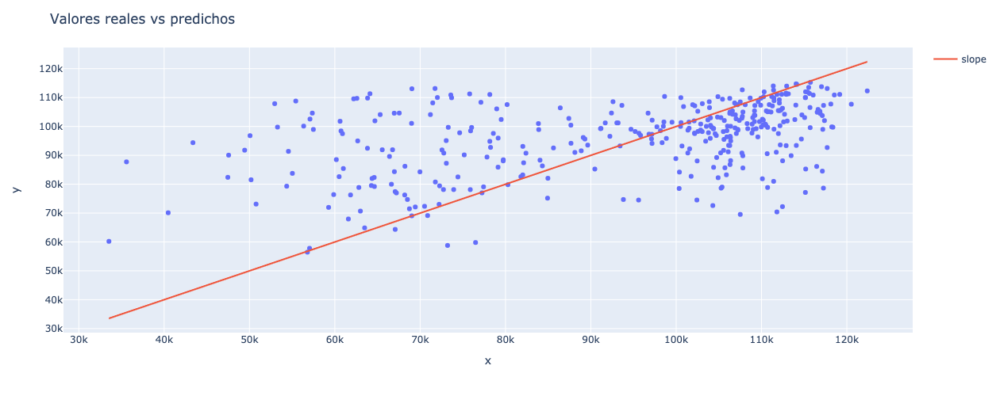

In [65]:
#Gráfico de valores reales vs valores predichos para el Random Forest con hiperparámetros optimziados
fig = px.scatter(x=y_test, y=y_test_pred)
fig.add_trace(
    go.Scatter(x=y_test, y=y_test, name="slope", line_shape='linear')
)
fig.update_layout(height=500, width=500, title_text="Valores reales vs predichos")
fig.show()

In [66]:
#Evaluación del modelo Random Forest con hiperparámetros optimizados
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test}')
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
print(f'r2 en Train: {r2_train}')
print(f'r2 en Test: {r2_test}')

Raíz del error cuadrático medio en Train: 8254.72737286397
Raíz del error cuadrático medio en Test: 18468.556613854016
r2 en Train: 0.8422651298834972
r2 en Test: 0.16587694186559754


**Análisis**: la distribución de errores graficada con los histogramas es de carácter simétrica, similar a una distribución de tipo gaussiana. Además, las distribuciones son consistentes entre los conjuntos de train y test. Por ende, puede afirmarse que la aproximación de los datos es adecuada. En cuanto al gráfico de los valores de y vs y_pred en los datos de test, puede apreciarse que los puntos se ubican cerca de la recta, lo cual es indicador de que el modelo es un buen regresor. 

### Predicción 2020

Antes de incorporar al dataset los datos de 2020, verifico que contenga los mismos campos para las valores que voy a filtrar ('estación')

In [67]:
#Importación de datasets
data_2020 = pd.read_csv('flujo-vehicular-2020.csv', sep =',')
data_2019 = pd.read_csv('flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('flujo-vehicular-2017.csv', sep =',')

In [68]:
print(data_2020['estacion'].unique())
print(data_2019['estacion'].unique())
print(data_2018['estacion'].unique())
print(data_2017['estacion'].unique())

['ALBERDI' 'AVELLANEDA' 'DELLEPIANE LINIERSLEPIANE CENTRO'
 'DELLEPIANE LINIERS' 'ILLIA' 'ILP' 'PB1' 'PB3' 'PB4' 'RETIRO' 'SALGUERO'
 'SARMIENTO' 'PB2']
['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


Puede observarse que para el dataset de 2020, la estación Illia se encuentra en mayúsculas (a diferencia de los 3 años anteriores). Por ende, primero se va a preparar por separado el dataset para 2020, y luego se agregarán los años anteriores

In [69]:
#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask = data_2020.estacion=='ILLIA'
data_2020 = data_2020[mask]

#Quitamos las columnas que no vamos a utilizar
data_2020.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion','dia_fecha'], inplace = True)

data_2020.head()

,fecha,mes,dia,hora_fin,tipo_vehiculo,observacion,sentido,cantidad_pasos
52,2020-01-01 00:00:00,enero,Miércoles,1.0,Auto,Efectivo,Centro,326.0
53,2020-01-01 00:00:00,enero,Miércoles,1.0,Auto,Efectivo,Provincia,319.0
54,2020-01-01 00:00:00,enero,Miércoles,1.0,Auto,Exento - Reglamento,Centro,2.0
55,2020-01-01 00:00:00,enero,Miércoles,1.0,Auto,Exento - Reglamento,Provincia,1.0
56,2020-01-01 00:00:00,enero,Miércoles,1.0,Auto,Paso en Infracción,Centro,4.0


In [70]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
data_2020['fecha2'] = pd.to_datetime(data_2020.fecha) + pd.to_timedelta(data_2020.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
data_2020.drop(columns=['fecha','hora_fin'], inplace = True)

data_2020.head()

,mes,dia,tipo_vehiculo,observacion,sentido,cantidad_pasos,fecha2
52,enero,Miércoles,Auto,Efectivo,Centro,326.0,2020-01-01 01:00:00
53,enero,Miércoles,Auto,Efectivo,Provincia,319.0,2020-01-01 01:00:00
54,enero,Miércoles,Auto,Exento - Reglamento,Centro,2.0,2020-01-01 01:00:00
55,enero,Miércoles,Auto,Exento - Reglamento,Provincia,1.0,2020-01-01 01:00:00
56,enero,Miércoles,Auto,Paso en Infracción,Centro,4.0,2020-01-01 01:00:00


In [71]:
#Corregimos el nombre de fecha2 a fecha
data_2020.rename(columns = {'fecha2':'fecha'}, inplace = True) 
data_2020.head()

,mes,dia,tipo_vehiculo,observacion,sentido,cantidad_pasos,fecha
52,enero,Miércoles,Auto,Efectivo,Centro,326.0,2020-01-01 01:00:00
53,enero,Miércoles,Auto,Efectivo,Provincia,319.0,2020-01-01 01:00:00
54,enero,Miércoles,Auto,Exento - Reglamento,Centro,2.0,2020-01-01 01:00:00
55,enero,Miércoles,Auto,Exento - Reglamento,Provincia,1.0,2020-01-01 01:00:00
56,enero,Miércoles,Auto,Paso en Infracción,Centro,4.0,2020-01-01 01:00:00


In [72]:
#Reordenamos el dataset por fecha
data_2020.sort_values('fecha', inplace = True)
data_2020.reset_index(drop=True, inplace = True)
data_2020

,mes,dia,tipo_vehiculo,observacion,sentido,cantidad_pasos,fecha
0,enero,Miércoles,Pesados 2 Ejes,Efectivo,Centro,1.0,2020-01-01 00:00:00
1,enero,Miércoles,Pesados 2 Ejes,Tag - PosPago,Provincia,2.0,2020-01-01 00:00:00
2,enero,Miércoles,Pesados 2 Ejes,Tag - PosPago,Centro,5.0,2020-01-01 00:00:00
3,enero,Miércoles,Pesados 2 Ejes,Exento - Reglamento,Centro,1.0,2020-01-01 00:00:00
4,enero,Miércoles,Pesados 2 Ejes,Efectivo,Provincia,3.0,2020-01-01 00:00:00
...,...,...,...,...,...,...,...
296048,diciembre,Jueves,Auto,Tag - PrePago,Provincia,3.0,2020-12-31 23:00:00
296049,diciembre,Jueves,Auto,Tag - PrePago OCR,Centro,1.0,2020-12-31 23:00:00
296050,diciembre,Jueves,Auto,Tag - PrePago OCR,Provincia,1.0,2020-12-31 23:00:00
296051,diciembre,Jueves,Pesados 2 Ejes,Tag - PosPago OCR,Centro,1.0,2020-12-31 23:00:00


In [73]:
#Resampleamos nuestros datos para agrupar por dia
diario_2020 = data_2020.resample('D', on = 'fecha').sum()
print(diario_2020.shape)
diario_2020.head()

(366, 1)


,cantidad_pasos
fecha,
2020-01-01,41240.0
2020-01-02,84669.0
2020-01-03,89651.0
2020-01-04,58204.0
2020-01-05,52264.0


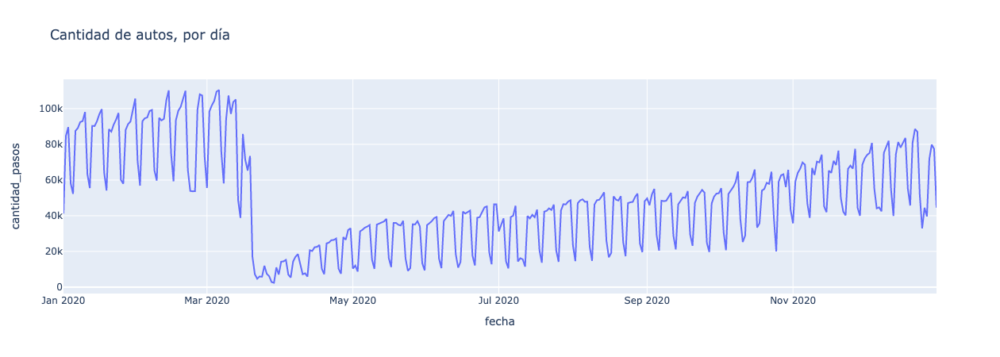

In [74]:
fig = px.line(diario_2020, x=diario_2020.index, y="cantidad_pasos", title='Cantidad de autos, por día')
fig.show()

**Análisis**: puede apreciarse el marcado declive de tránsito hacia finales de marzo y principios de abril, producto de las primeras restricciones por la pandemia de COVID-19, y el progresivo aumento, llegando hacia fin de año a valores similares previos a la pandemia.

In [75]:
#Unimos todos los datasets
diario2020 = pd.concat([diario,diario_2020])
diario2020.head()

,cantidad_pasos
fecha,
2017-01-01,45478.0
2017-01-02,89289.0
2017-01-03,92602.0
2017-01-04,95813.0
2017-01-05,100044.0


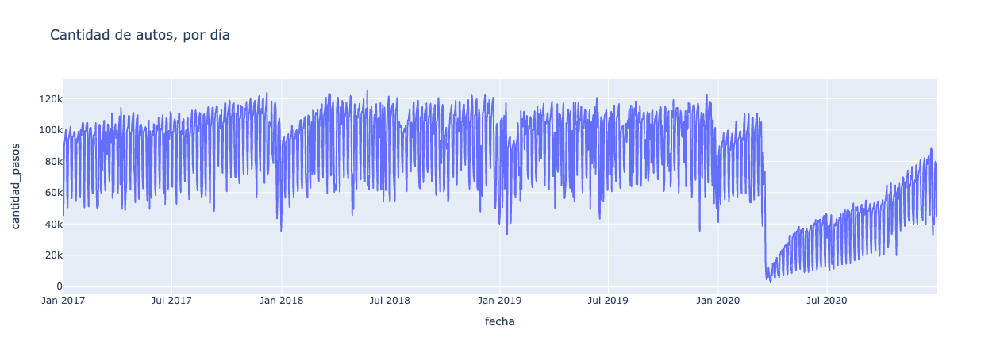

In [76]:
fig = px.line(diario2020, x=diario2020.index, y="cantidad_pasos", title='Cantidad de autos, por día')
fig.show()

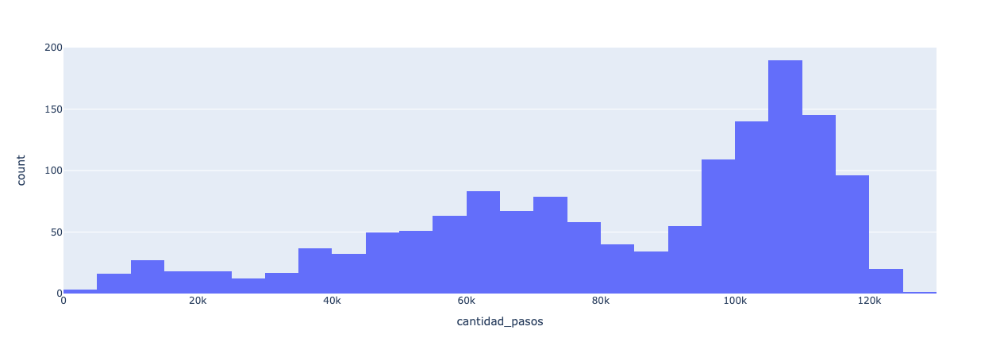

In [77]:
#Histograma para ver cómo es la distribución de la cantidad de pasos por día
fig = px.histogram(diario2020, x="cantidad_pasos")
fig.show()

In [78]:
#Copia del dataset original
dt_original_2020 = diario2020.copy()
dt_original_2020.head()

,cantidad_pasos
fecha,
2017-01-01,45478.0
2017-01-02,89289.0
2017-01-03,92602.0
2017-01-04,95813.0
2017-01-05,100044.0


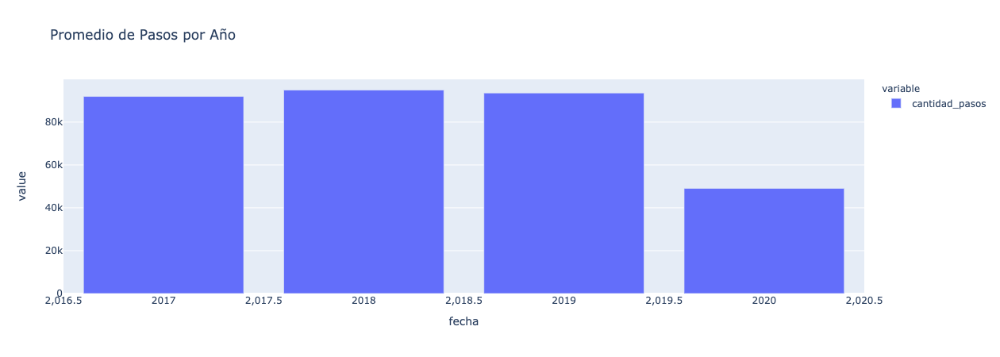

In [79]:
#Promedio de pasos diarios por año
dt_original_2020.reset_index(inplace=True)
pasos_anuales = dt_original_2020.groupby(dt_original_2020.fecha.dt.year)['cantidad_pasos'].mean()
fig = px.bar(pasos_anuales,title='Promedio de Pasos por Año')
fig.show()

**Análisis**: como se mencionó anteriormente, es claro el impacto de las restricciones por la pandemia en el tránsito, siendo el promedio diario de 2020 casi la mitad del promedio de años anteriores.

### Modelo

In [80]:
#Impresión del shape del nuevo dataset
diario2020.shape

(1461, 1)

In [81]:
#Definición del lookback para el modelo
look_back = 90*1

In [82]:
#Definición de x e y
N=diario2020.shape[0]
X= np.zeros((N-look_back-1, look_back))
y= np.zeros(N-look_back-1)

print(X.shape, y.shape)

(1370, 90) (1370,)


In [83]:
#Definición de la función
for i in range(X.shape[0]):
    X[i,:] = diario2020.values[i:i+look_back].ravel()
    y[i] = diario2020.values[i+look_back]

In [84]:
#Separación entre datos de entrenamiento y evaluación
N_train = 3*365 - look_back # cantidad de instancias que vamos a usar para entrenar. 
N_test = 365 #cantidad de puntos que vamos a usar para evaluar
N_total = N_train + N_test

length_total = N_train + N_test + look_back

X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test]
print(X_test.shape, y_test.shape)

(1005, 90) (1005,)
(365, 90) (365,)


In [85]:
#Definición del modelo de regresión con random forest
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs = 4).fit(X_train,y_train)

In [86]:
y_pred = rf.predict(X)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

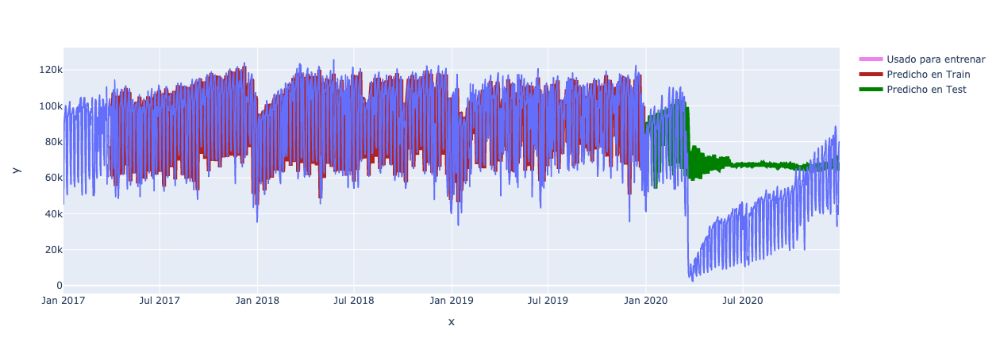

In [87]:
fig = px.line(diario2020, x=diario2020.index[:length_total], y=diario2020.cantidad_pasos[:length_total],width=10)
fig.add_scatter(x=diario2020.index[:N_train + look_back - 1], y=diario2020[:N_train + look_back - 1], mode='lines', name = 'Usado para entrenar',line=dict(color='violet', width=5))
fig.add_scatter(x=diario2020.index[look_back: look_back + N_train], y=y_train_pred, mode='lines', name = 'Predicho en Train',line=dict(color='firebrick', width=5))
fig.add_scatter(x=diario2020.index[N_train+look_back: length_total-1], y=y_test_pred, mode='lines', name = 'Predicho en Test',line=dict(color='green', width=5))
fig.show()

**Análisis**: como era de esperar, el modelo no logra predecir adecuadamente el flujo de tránsito en el año 2020.

In [88]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

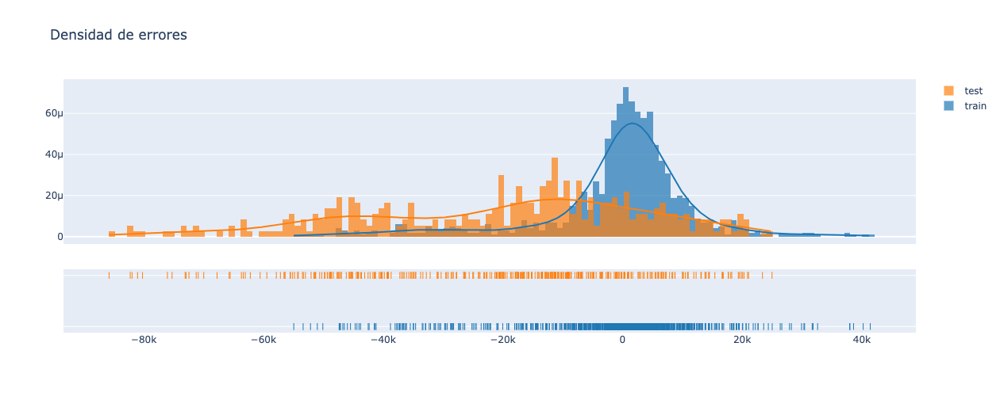

In [89]:
###Gráfico de la densidad de errores para el Random Forest
x1 = y_train - y_train_pred
x2 = y_test - y_test_pred
hist_data = [x1, x2]
group_labels = ['train', 'test']
fig = ff.create_distplot(hist_data, group_labels, bin_size=1000)
fig.update_layout(height=500, width=500, title_text="Densidad de errores")
fig.show()

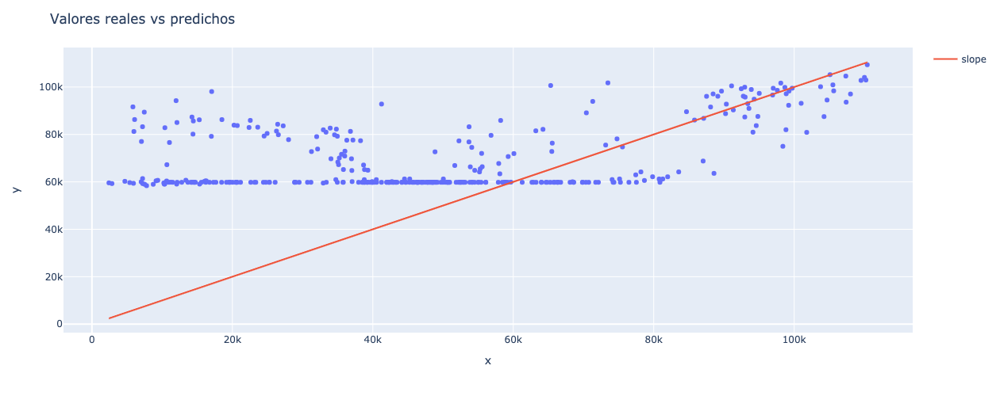

In [90]:
#Gráfico de valores reales vs valores predichos para el Random Forest
fig = px.scatter(x=y_test, y=y_test_pred)
fig.add_trace(
    go.Scatter(x=y_test, y=y_test, name="slope", line_shape='linear')
)
fig.update_layout(height=500, width=500, title_text="Valores reales vs predichos")
fig.show()

In [91]:
#Evaluación del modelo Random Forest
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test}')
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
print(f'r2 en Train: {r2_train}')
print(f'r2 en Test: {r2_test}')

Raíz del error cuadrático medio en Train: 13016.393478191092
Raíz del error cuadrático medio en Test: 31132.415044582565
r2 en Train: 0.6022485557948345
r2 en Test: -0.3074080491684559


**Análisis**: a pesar de que la distribución de errores graficada con los histogramas es de carácter simétrica y similar a una distribución de tipo gaussiana, entre los conjuntos de train y test las distribuciones difieren fuertemente. Por ende, puede afirmarse que la aproximación de los datos es incorrecta. En cuanto al gráfico de los valores de y vs y_pred en los datos de test, se observa una gran distancia entre los puntos y la recta, indicando que el modelo no es un buen regresor.

## Conclusiones

En este informe final, se plantearon tres objetivos:
* Utilización de la librería **Plotly** para los gráficos;
* Profundización del **Análisis Exploratorio de Datos**;
* Armado del modelo sin filtrar el dataset por alguna **forma de pago** en particular.

A continuación, se presentan comentarios sobre cada uno:

**Plotly**

La utilización de esta librería de visualización de datos permitió integrar al notebook gráficos más complejos y altamente interactivos, teniendo como resultado una lectura más profunda e interesante.

**Análisis Exploratorio de Datos**

Un EDA más extenso permitió, junto con la utilización de Plotly para la visualización, justificar la decisión de no filtrar el dataset por una forma de pago específica (tercer objetivo del informe), y así obtener un modelo más complejo que el anterior.